In [ ]:
#Download the Dataset

In [1]:
!wget  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2024-06-01 09:42:11--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 104.119.184.235, 2600:1406:5400:485::317f, 2600:1406:5400:4a9::317f
Connecting to download.microsoft.com (download.microsoft.com)|104.119.184.235|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M  67.1MB/s    in 12s     

2024-06-01 09:42:23 (66.1 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



In [ ]:
##Unzip the data

In [2]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

In [ ]:
#!pip install tensorflow

In [4]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
  for path in os.listdir("PetImages/"+class_name):
    if class_name == "Cat":
      label.append(0)
    else:
      label.append(1)
    input_path.append(os.path.join("PetImages",class_name,path))
print(input_path[0],label[0])

PetImages/Cat/8581.jpg 0


In [5]:
print(input_path[25000],label[25001])

PetImages/Dog/9568.jpg 1


In [8]:
df = pd.DataFrame()
df["images"] = input_path
df['labels'] = label
df=df.sample(frac=1).reset_index(drop=True)
df.head()

,images,labels
0,PetImages/Dog/3936.jpg,1
1,PetImages/Cat/9582.jpg,0
2,PetImages/Cat/1581.jpg,0
3,PetImages/Cat/9502.jpg,0
4,PetImages/Cat/9911.jpg,0


In [32]:
for i in df['images']:
  if 'jpg' not in i:
    print(i)

PetImages/Cat/Thumbs.db
PetImages/Dog/Thumbs.db


In [35]:
import PIL
l = []
for image in df['images']:
  try:
    img = PIL.Image.open(image)
  except:
    l.append(image)

l

['PetImages/Cat/666.jpg', 'PetImages/Dog/11702.jpg']

In [36]:
# Delete DB files
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']

len(df)

24998

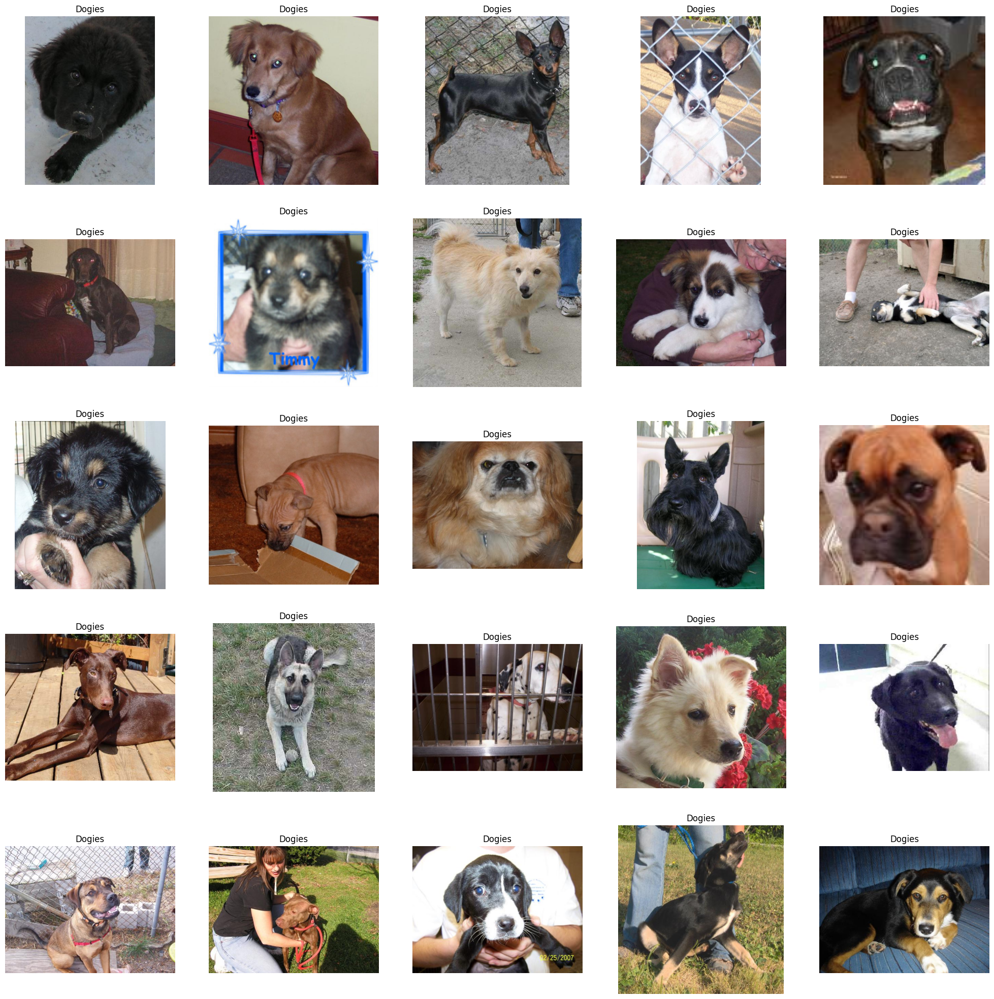

In [10]:
plt.figure(figsize=(25,25))
temp=df[df['labels']==1]['images']
start=random.randint(0,len(temp))
files=temp[start:start+25]

for index,file in enumerate(files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title("Dogies")
  plt.axis("Off")

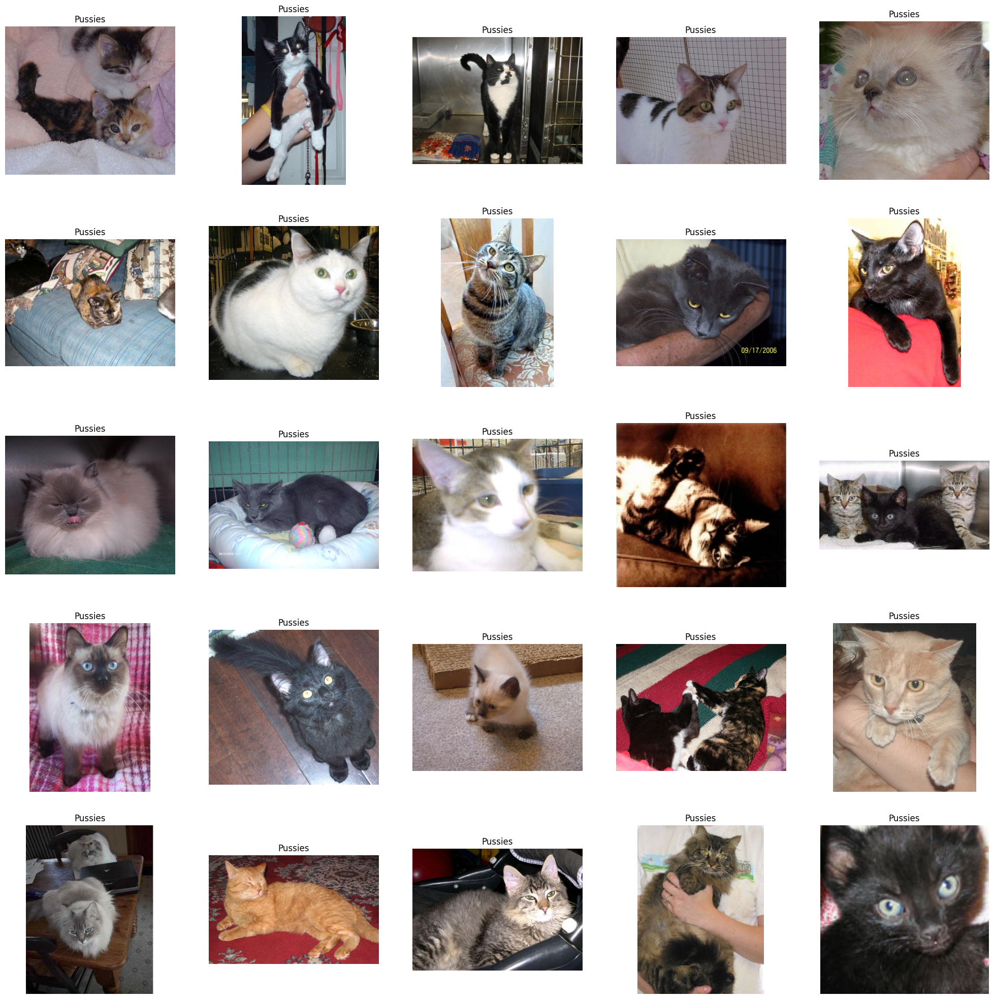

In [13]:
plt.figure(figsize=(25,25))
temp=df[df['labels']==0]['images']
start=random.randint(0,len(temp))
files=temp[start:start+25]

for index,file in enumerate(files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title("Pussies")
  plt.axis("Off")

<Axes: ylabel='count'>

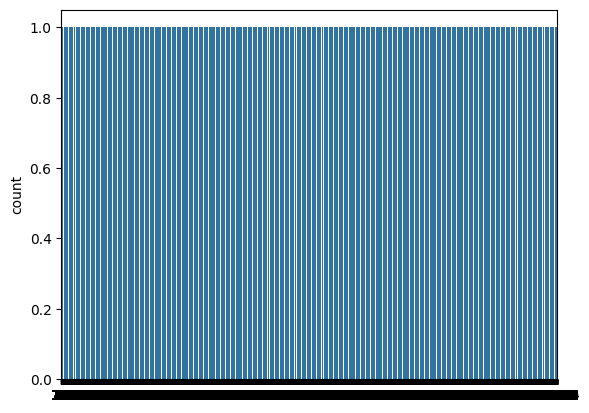

In [15]:
import seaborn as sns
sns.countplot(df['labels'])

In [37]:
df['labels'] = df['labels'].astype('str')

In [38]:
df.head()

,images,labels
0,PetImages/Dog/3936.jpg,1
1,PetImages/Cat/9582.jpg,0
2,PetImages/Cat/1581.jpg,0
3,PetImages/Cat/9502.jpg,0
4,PetImages/Cat/9911.jpg,0


In [39]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=43)

In [40]:
train.head()

,images,labels
17479,PetImages/Dog/12037.jpg,1
18405,PetImages/Dog/2128.jpg,1
18289,PetImages/Dog/4643.jpg,1
24924,PetImages/Dog/11461.jpg,1
3364,PetImages/Cat/7389.jpg,0


In [41]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 40,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(train,
                                                     x_col='images',
                                                     y_col='labels',
                                                     target_size=(128,128),
                                                     batch_size=512,
                                                     class_mode='binary')

val_iterator = val_generator.flow_from_dataframe(test,
                                                     x_col='images',
                                                     y_col='labels',
                                                     target_size=(128,128),
                                                     batch_size=512,
                                                     class_mode='binary')


Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


In [42]:
# Model Creation

In [43]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
    Conv2D(16, (3,3), activation = 'relu', input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32, (3,3), activation = 'relu'),
    MaxPool2D((2,2)),
    Conv2D(64, (3,3), activation = 'relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512, activation = 'relu'),
    Dense(1, activation = 'sigmoid')
])

In [26]:
#model.compile(optimizer='adam', loss='binary_cross_entropy', metrices=['accuracy'])
#model.summary()

In [45]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 63, 63, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 14, 14, 64)       

In [47]:
history = model.fit(train_iterator, epochs=20, validation_data = val_iterator)

Epoch 1/20
40/40 [==============================] - 440s 11s/step - loss: 0.6859 - accuracy: 0.5547 - val_loss: 0.6557 - val_accuracy: 0.5882
Epoch 2/20
40/40 [==============================] - 435s 11s/step - loss: 0.5995 - accuracy: 0.6787 - val_loss: 0.5728 - val_accuracy: 0.6970
Epoch 3/20
40/40 [==============================] - 442s 11s/step - loss: 0.5631 - accuracy: 0.7104 - val_loss: 0.5415 - val_accuracy: 0.7222
Epoch 4/20
40/40 [==============================] - 432s 11s/step - loss: 0.5436 - accuracy: 0.7244 - val_loss: 0.5626 - val_accuracy: 0.7112
Epoch 5/20
40/40 [==============================] - 441s 11s/step - loss: 0.5277 - accuracy: 0.7367 - val_loss: 0.5083 - val_accuracy: 0.7568
Epoch 6/20
40/40 [==============================] - 445s 11s/step - loss: 0.5022 - accuracy: 0.7542 - val_loss: 0.4714 - val_accuracy: 0.7746
Epoch 7/20
40/40 [==============================] - 441s 11s/step - loss: 0.5050 - accuracy: 0.7519 - val_loss: 0.4917 - val_accuracy: 0.7620
Epoch 

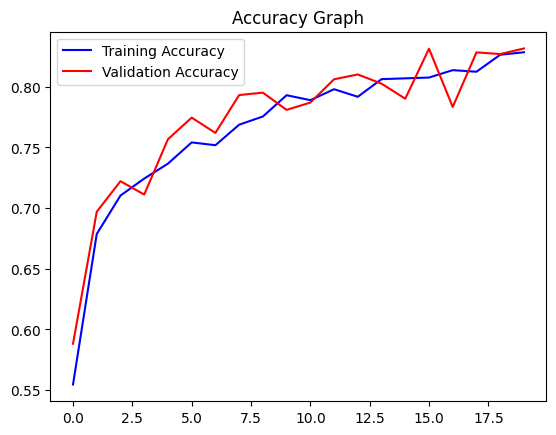

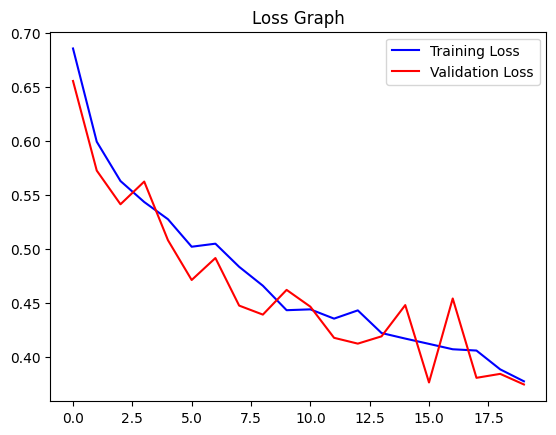

In [51]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()